# Task 2
# Part 1 : Image Reconstruction

 Choose any image you like. Use Random Fourier Features (RFF) and Linear Regression to learn the mapping from the image coordinates (X,Y) to the pixel colors (R,G,B). Here, (X,Y) represents the coordinates of the pixels, and (R,G,B) represents the color values at those coordinates. Display both the original image and the reconstructed image. Also, calculate and report the Root Mean Squared Error (MSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed images. [1.5 Mark]

### Notes

Generally, in ML the a good probabilisitc model for function mapping/fitting is a **Gaussian Process**,

f(x) ~ GP(m(x),k(x,x'))


Here, any function f(x) can be mapped using a gaussian process with a multivariate distribution of mean component of m(x) and a covariance component k(x,x').

The Gaussian kernel or the RBF -> Radial Basis Function is a type of kernel that uses the kernel of the Gaussian function.

A kernel is essentially a similarity function

Types of kernels:
1. Linear
2. Radial Basis
3. Polynomial

---

**RFF** is a specific method/technique to approximate any kernel. Instead of directly using the RBF kernel, RFF samples from a Fourier transform of the kernel, allowing you to represent the kernel as an inner product in a lower-dimensional space. The idea is to project the data into a new space where linear models are effective, reducing the cost of kernel evaluations.




### Importing Essential Libraies 

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import math

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

#Removing all the warnings
import warnings
warnings.filterwarnings('ignore')

#Setting env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Retina display, better graphs
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange
#rearranging the channel differnece in between matplotlib expectations and torch expectations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


### Accessing Data 

In [2]:
import requests

response = requests.get('https://images.unsplash.com/photo-1545063914-a1a6ec821c88?q=80&w=2070&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D')

if response.status_code == 200:
    with open('deer.jpg', 'wb') as f:
        f.write(response.content)
    print('deer.jpg downloaded')
else:
    print('Failed to download image')

deer.jpg downloaded


In [3]:
img = torchvision.io.read_image("deer.jpg")
print(img.shape)

torch.Size([3, 1380, 2070])


(1380, 2070, 3)

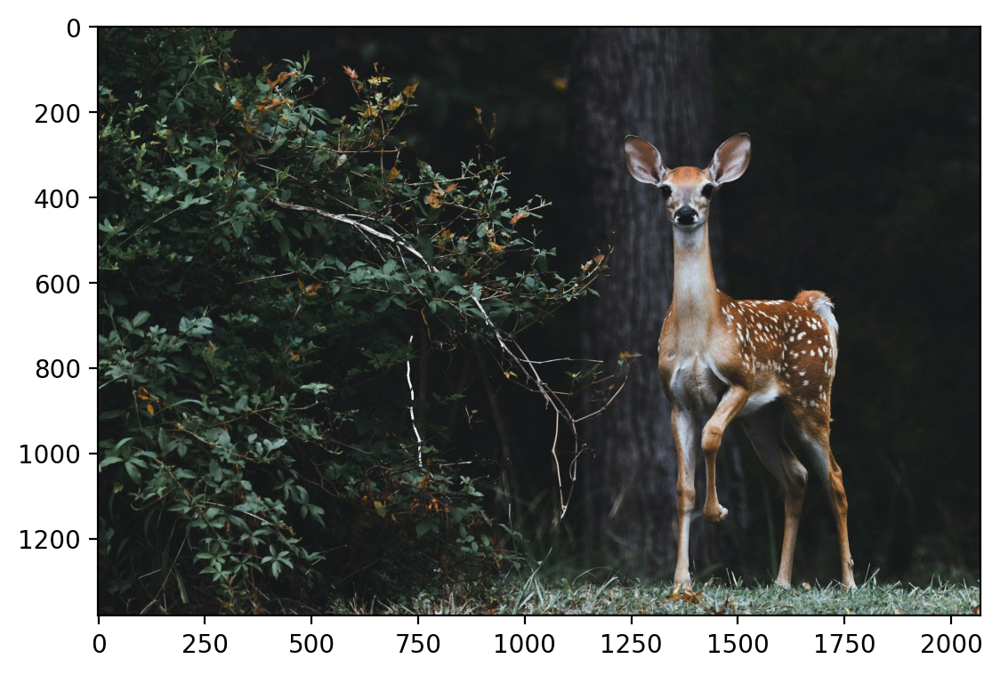

In [4]:
'''
The rearrangement is done to convert the image from the default CHW (Channel-Height-Width) order to HWC (Height-Width-Channel) order,
which is the typical order used in image processing and display.

we convert to np because that is what matplotlib expects.

'''
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())
rearrange(img, 'c h w -> h w c').numpy().shape

The fit method is used to fit the scaler to the input data. In this case, the input data is the image img, which is reshaped to a 2D array with shape (height * width, 1) using the reshape method.

The fit method calculates the minimum and maximum values of the input data and stores them internally.

The purpose of scaling the image pixel values is to normalize them to a common range, which can be useful for various reasons:

It can help prevent features with large ranges from dominating the model's predictions.

It can improve the performance of algorithms that rely on the similarity between features.
It can make it easier to compare features from different images.

### Pre-processing of the image 

In [5]:
from sklearn import preprocessing

In [6]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

def pre_process_img(img, scaler_img):
  img_array = np.array(img)
  img_scaled = scaler_img.transform(img_array.reshape(-1, 1)).reshape(img_array.shape)
  print(f"The scaled image shape (scaled in np form) : {img_scaled.shape}")

  img_scaled = torch.tensor(img_scaled).float()

  plt.imshow(rearrange(img_scaled, 'c h w -> h w c').numpy())

  return img_scaled

The scaled image shape (scaled in np form) : (3, 1380, 2070)


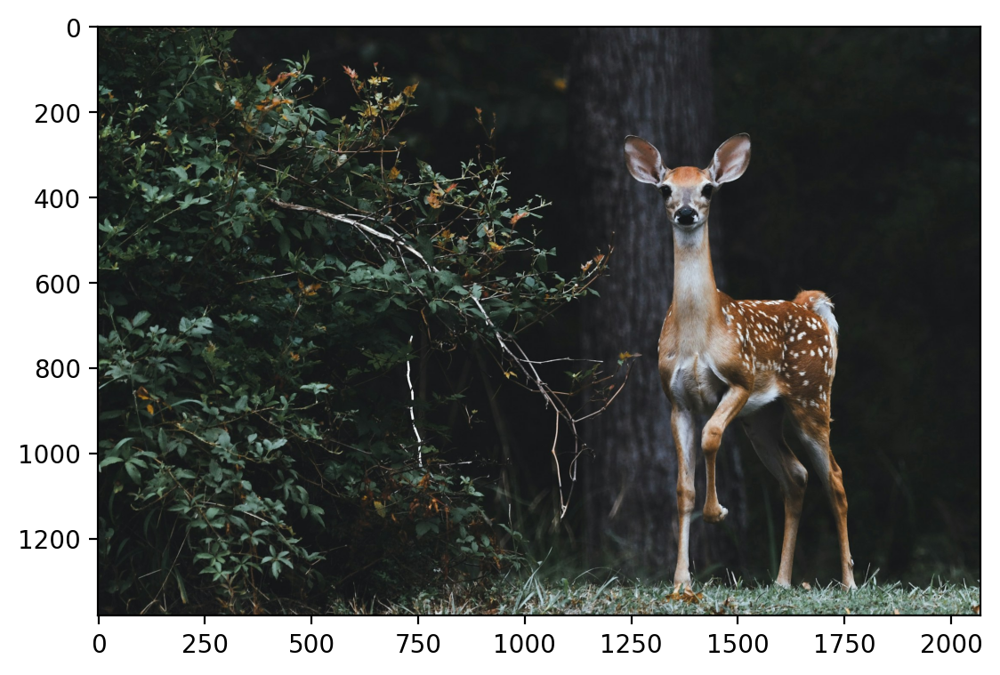

In [7]:
img_scaled = pre_process_img(img, scaler_img)
img_scaled = img_scaled.to(device)
#inherently matplotlib is smart enough to detect the scaled pixel values as rgb as well

In [8]:
#here we manually need to put the values. 
#torchvision.transforms.functional.crop(img: Tensor, top: int, left: int, height: int, width: int) → Tensor
#top => vertical component of top left, left => hz. componenet of it. 
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 250, 1200, 400, 400) #we can get the required by trial and error. 
crop = crop.to(device)
crop.shape

torch.Size([3, 400, 400])

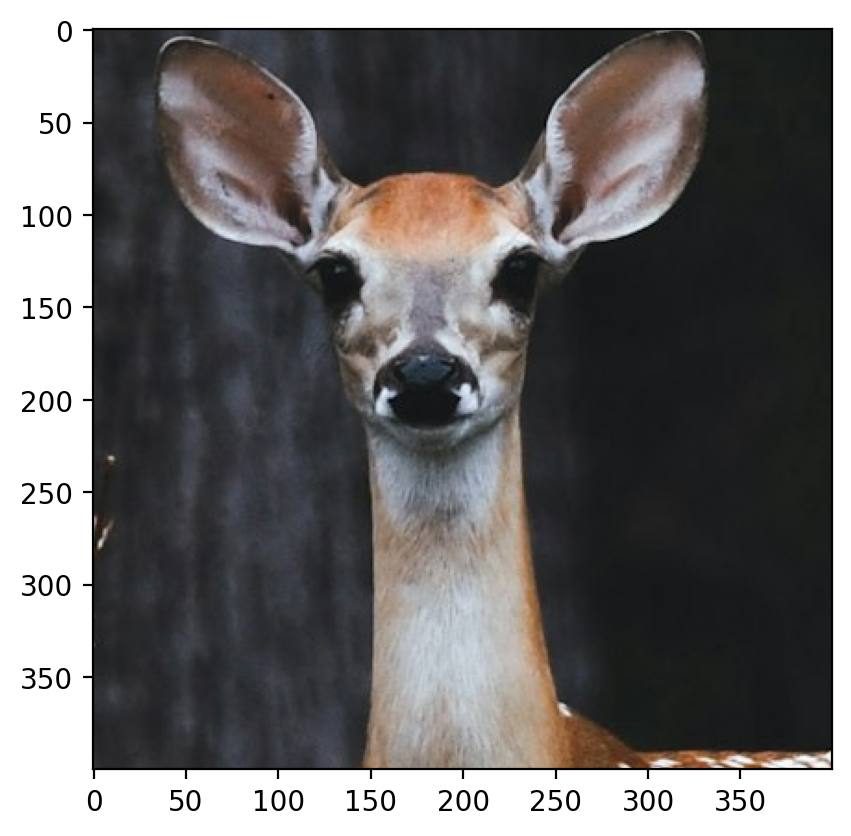

In [9]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
#we take a 400*400 image so that we can have more features for the rff kernel

### Tensor pre-processing and shaping for modelling

In [10]:
#Get the dimensions of the image tensor, checkup that things are as expected 
num_channels, height, width = crop.shape
print(f"The number of channels: {num_channels}, The height of the image {height}px, The width of the image: {width}px")

The number of channels: 3, The height of the image 400px, The width of the image: 400px


In [13]:
# #Code for demonstration of what we are doing in the coordinate map function

# num_channels, height, width = 2, 3, 4

    
# # Create a 2D grid of (x,y) coordinates
# w_coords = torch.arange(width).repeat(height, 1)
# print(w_coords)
# h_coords = torch.arange(height).repeat(width, 1).t()
# print(h_coords)
# w_coords = w_coords.reshape(-1)
# print(w_coords)
# h_coords = h_coords.reshape(-1)
# print(h_coords)

# # Combine the x and y coordinates into a single tensor
# X = torch.stack([h_coords, w_coords], dim=1).float()
# X

In [11]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)

    We are transforming the image in 2 tensors => pixel coordinates and pixel values(features)

    
    """

    num_channels, height, width = img.shape

    #Create a 2D grid of (x,y) coordinates (h, w)
    #width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1) #2d grid, with x coordinates varying across columns.
    h_coords = torch.arange(height).repeat(width, 1).t() #2d grid, with y coordinates varying across rows. 
    
    #making both into a 1D tensor
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    #Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float() # [y,x]....

    #Move X to GPU if available
    X = X.to(device)

    #Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [12]:
#printing to verify the expected changes
deer_X, deer_Y = create_coordinate_map(crop)

print(f"The shape of my coordinate tensor : {deer_X.shape}, The shape of my pixel tensor : {deer_Y.shape}")


The shape of my coordinate tensor : torch.Size([160000, 2]), The shape of my pixel tensor : torch.Size([160000, 3])


In [13]:
print(deer_X[:5])
#notice how we have scaled even rgb for numerical stability. 
'''
Raw RGB values in the range of 0 to 255 can cause issues like vanishing or exploding gradients, especially in 
deeper networks. Scaling the RGB values helps prevent these issues by keeping the input values within a range 
that makes training more stable and efficient.

'''
print("\n")
print(deer_Y[:5])

tensor([[0., 0.],
        [0., 1.],
        [0., 2.],
        [0., 3.],
        [0., 4.]], device='cuda:0')


tensor([[0.1608, 0.1608, 0.1686],
        [0.1608, 0.1608, 0.1686],
        [0.1647, 0.1647, 0.1725],
        [0.1686, 0.1686, 0.1765],
        [0.1765, 0.1765, 0.1843]], device='cuda:0')


In [15]:
#Here, we scaled the x-coordinates for numerical stability

#MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(deer_X.cpu())

#Scale the X coordinates
deer_X_scaled = scaler_X.transform(deer_X.cpu())

#Move the scaled X coordinates to the GPU
deer_X_scaled = torch.tensor(deer_X_scaled).to(device)

#Set to dtype float32
deer_X_scaled = deer_X_scaled.float()

#difference is observable here
print("After scaling coordinates")
print(deer_X_scaled[:5])

print("Before scaling coordinates")
deer_X[:5]

After scaling coordinates
tensor([[-1.0000, -1.0000],
        [-1.0000, -0.9950],
        [-1.0000, -0.9900],
        [-1.0000, -0.9850],
        [-1.0000, -0.9799]], device='cuda:0')
Before scaling coordinates


tensor([[0., 0.],
        [0., 1.],
        [0., 2.],
        [0., 3.],
        [0., 4.]], device='cuda:0')

### Defining rmse and psnr function 

#### RMSE 
$$ \text{RMSE} = \sqrt{\frac{1}{n}\sum_{i=1}^n (y_i - \hat{y}_i)^2} $$ 


#### PSNR 
$$ \text{PSNR} = 20 \cdot \log_{10}\left(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}}\right) $$

In [16]:
def rmse_psnr(original_img, reconstructed_img):
    """
    Computes the RMSE and PSNR between the original and reconstructed images.
    
    original_img: torch.Tensor of shape (num_channels, height, width)
    reconstructed_img: torch.Tensor of the same shape as original_img
    """
    
    #while inputting the function 
    original_img = original_img.float()
    reconstructed_img = reconstructed_img.float()

    #Ensure shapes match
    if original_img.shape != reconstructed_img.shape:
        raise ValueError(f"Shape mismatch: original_img {original_img.shape} vs reconstructed_img {reconstructed_img.shape}")

    #Compute RMSE
    mse = F.mse_loss(reconstructed_img, original_img)#using inbuilt torch function
    rmse = torch.sqrt(mse).item() 

    #Compute PSNR
    max_pixel_value = 1.0  # Assume images are normalized to [0, 1]
    psnr = 20 * torch.log10(max_pixel_value / torch.sqrt(mse)).item()
    
    return (rmse,psnr)

## Understanding the model used

In [37]:
from torchinfo import summary  #generating model summaries

def print_model_parameters(model):
    print("Model Parameters:\n")
    for name, param in model.named_parameters():
        if param.requires_grad:
            #printing all params that are updated
            print(f"{name}: {param.data}")

### Linear Regression -> Vanilla 

In [18]:
def helper_metric_function_linear (original_img, X, net):
    num_channels, height, width = crop.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        outputs = outputs.permute(2, 0, 1)
    return outputs

In [19]:
class LinearModel(nn.Module):
  #subclass of the torch.nn.module 
    def __init__(self, in_features, out_features):
      #constructor 
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features) #Y = XW+b

    def forward(self, x):
        return self.linear(x)

![Linear Regression Vanilla](https://miro.medium.com/v2/resize:fit:960/0*rHOClzLZwTKY6Q6O.png)

In [20]:
net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [21]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2) in our case, only 1 sample. 
    Y: torch.Tensor of shape (num_samples, 3)
    verbose = true prints loss every 100 epochs 
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()

        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return f"the final loss is {loss.item()}"

In [22]:
train(net, 0.01, deer_X_scaled, deer_Y, 2000)

Epoch 0 loss: 0.292508
Epoch 100 loss: 0.042311
Epoch 200 loss: 0.042125
Epoch 300 loss: 0.042125
Epoch 400 loss: 0.042125
Epoch 500 loss: 0.042125
Epoch 600 loss: 0.042125
Epoch 700 loss: 0.042125
Epoch 800 loss: 0.042125
Epoch 900 loss: 0.042125
Epoch 1000 loss: 0.042125
Epoch 1100 loss: 0.042125
Epoch 1200 loss: 0.042125
Epoch 1300 loss: 0.042125
Epoch 1400 loss: 0.042125
Epoch 1500 loss: 0.042125
Epoch 1600 loss: 0.042125
Epoch 1700 loss: 0.042125
Epoch 1800 loss: 0.042125
Epoch 1900 loss: 0.042125


'the final loss is 0.04212470352649689'

In [38]:
#Model summary
'''
3 cross 2 matrix is weight, hence 2 is input dim, and 3 is output dim. 
'''
print_model_parameters(net)

Model Parameters:

linear.weight: tensor([[ 0.0035, -0.0522],
        [ 0.0119, -0.0514],
        [ 0.0112, -0.0615]], device='cuda:0')
linear.bias: tensor([0.2755, 0.2648, 0.2652], device='cuda:0')


In [24]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")
    

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

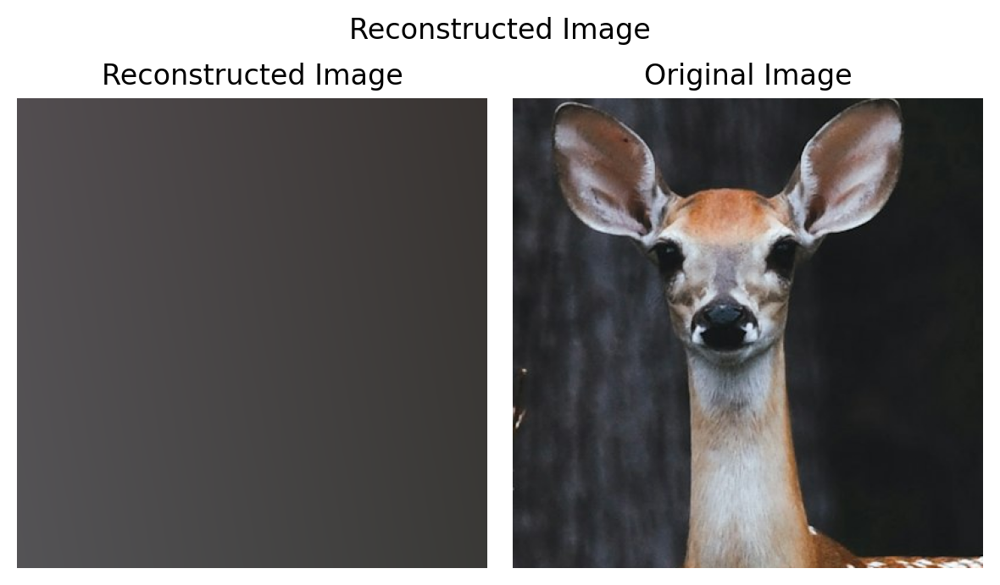

In [25]:
plot_reconstructed_and_original_image(crop, net, deer_X_scaled, title="Reconstructed Image\n")

In [39]:
output_img =  helper_metric_function_linear (crop, deer_X_scaled, net)
(RMSE, PSNR)=rmse_psnr(crop, output_img)

print(f"\n the rmse is {RMSE} \n and the PSNR is {PSNR}") 
#think of it as a linear transformation


 the rmse is 0.2052430361509323 
 and the PSNR is 13.754631280899048


### Random Fourier Features 

In [40]:
from sklearn.kernel_approximation import RBFSampler

In [42]:
def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)
#sigma is expanse from the mean

![Linear Regression Vanilla](https://miro.medium.com/v2/resize:fit:683/1*9rdkuNxjx5bCACeo1CVjpA.png)

### The Gaussian Kernel
$$\kappa(x, x') = \exp\left(-\frac{\|x-x'\|^2}{2\sigma^2}\right)$$

In [43]:
X_rff = create_rff_features(deer_X_scaled, 20000, 0.008)

In [52]:
print(f"We are moving from the space of {deer_X_scaled.shape} to the space of {X_rff.shape}")

We are moving from the space of torch.Size([160000, 2]) to the space of torch.Size([160000, 20000])


In [54]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, deer_Y, 1000)

Epoch 0 loss: 0.114898
Epoch 100 loss: 0.022675
Epoch 200 loss: 0.015480
Epoch 300 loss: 0.011176
Epoch 400 loss: 0.008280
Epoch 500 loss: 0.006242
Epoch 600 loss: 0.004768
Epoch 700 loss: 0.003684
Epoch 800 loss: 0.002880
Epoch 900 loss: 0.002280


'the final loss is 0.0018341351533308625'

In [55]:
#Model summary
'''
n cross m matrix is weight, hence m is input dim, and n is output dim. Here, n = 3
'''
print_model_parameters(net)

Model Parameters:

linear.weight: tensor([[ 0.4142, -0.0981,  0.4010,  ..., -0.0142, -0.0888,  0.1719],
        [ 0.6238, -0.1105,  0.2658,  ..., -0.0149, -0.0678,  0.1728],
        [ 0.7365, -0.1277,  0.2334,  ..., -0.0165, -0.0889,  0.1761]],
       device='cuda:0')
linear.bias: tensor([0.2942, 0.2814, 0.2824], device='cuda:0')


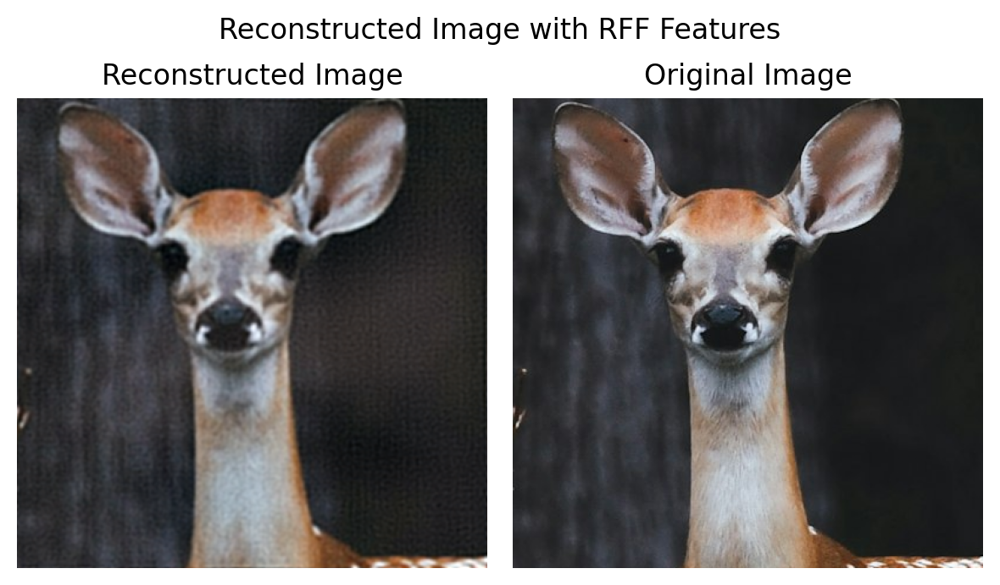

In [56]:
plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image with RFF Features\n")

In [57]:
def helper_metric_function (original_img, X, net):
    num_channels, height, width = crop.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        outputs = outputs.permute(2, 0, 1)
    return outputs

In [58]:
output_img =  helper_metric_function (crop, X_rff, net)
(RMSE, PSNR)=rmse_psnr(crop, output_img)

print(f"\n the rmse is {RMSE} \n and the PSNR is {PSNR}") 


 the rmse is 0.04278144985437393 
 and the PSNR is 27.374889850616455


## Part 2: Audio Reconstruction  [5 seconds] 

Pick a 5-second audio sample of your liking. Use Random Fourier Features (RFF) and Linear Regression to learn the mapping from time (t) to amplitude (A), where t is the time point, and A is the audio amplitude at that time. Play the reconstructed audio and the original audio to demonstrate reconstruction. Calculate the Root Mean Squared Error (RMSE) and Signal-to-Noise Ratio (SNR) to evaluate the reconstruction. 

### Importing essential libraries 

In [67]:
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import soundfile

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

cuda


### Downloading the audio

In [60]:
import requests
import io
from pydub import AudioSegment
import re

In [62]:
def download_file_from_google_drive(url):
    file_id = re.findall(r'/d/(.+?)/view', url)[0]
    download_url = f"https://drive.google.com/uc?export=download&id={file_id}"
    response = requests.get(download_url)
    response.raise_for_status()
    return io.BytesIO(response.content)

def convert_mp3_to_wav_and_extract(mp3_data, output_filename, start_time, end_time):
    audio = AudioSegment.from_mp3(mp3_data)
    start_ms = start_time * 1000
    end_ms = end_time * 1000
    extracted_audio = audio[start_ms:end_ms]
    #Export as WAV
    extracted_audio.export(output_filename, format="wav")

url = "https://drive.google.com/file/d/1VypozP7VgQTryhea4j_oQiClkoFmmFUn/view?usp=sharing"

print("Downloading the file...")
mp3_data = download_file_from_google_drive(url)


print("Converting to WAV, extracting portion, and saving...")
convert_mp3_to_wav_and_extract(mp3_data, "guitar_audio_excerpt.wav", start_time=5, end_time=12)
#18 second long audio, I am shortening it to 7 seconds

print("Done! The excerpt has been saved as guitar_audio_excerpt.wav")

Converting to WAV, extracting portion, and saving...
Done! The excerpt has been saved as guitar_audio_excerpt.wav


### Pre-processing

In [65]:
audio_path = '/kaggle/working/guitar_audio_excerpt.wav'

In [68]:
from IPython.display import Audio
import torchaudio

In [66]:
Audio(audio_path)

In [74]:
audio, sr = torchaudio.load(audio_path)

In [72]:
print(f"The sampling rate of my audio is {sr} per second")

The sampling rate of my audio is 44100 per second


In [80]:
print(audio.shape)
audio = audio[0] #doing this since the audio is stereo audio, meaning certain sound for right and certain for left

torch.Size([2, 308700])


In [81]:
tm = audio.shape[0] / sr
print(f"Audio length: {tm} seconds, with {sr} samples per second")

Audio length: 7.0 seconds, with 44100 samples per second


### Preliminary plots

In [82]:
def audio_plot(audio, sr, clr, tl):
    plt.figure(figsize=(15, 4))
    plt.plot(audio, color = clr, alpha = 0.7)
    plt.xticks(np.arange(0, audio.shape[0], sr), np.arange(0, audio.shape[0] / sr, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(tl)
    plt.grid()
    plt.show()

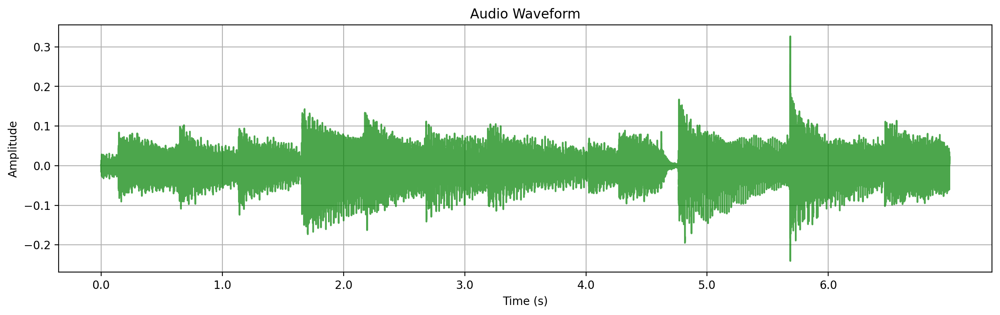

In [83]:
audio_plot(audio, sr, 'green', 'Audio Waveform')

### Audio cropping -> last 5 seconds 

In [84]:
audio_5s = audio[-5 * sr:]
print(audio_5s.shape)
print(audio_5s)

torch.Size([220500])
tensor([0.0231, 0.0197, 0.0168,  ..., 0.0120, 0.0090, 0.0063])


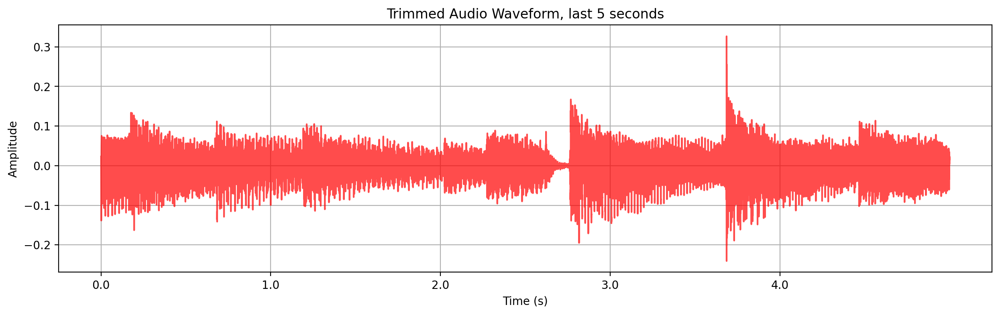

In [85]:
audio_plot(audio_5s, sr, 'red', 'Trimmed Audio Waveform, last 5 seconds')

### Normalizing the time domain

In [88]:
X = torch.arange(0, len(audio_5s)).unsqueeze(1).float()
X = X / X.max() * 200 - 100
print("\nMy time stamps scaled from -100 to 100\n")

print(X.shape)
print(X)
#comman practice for MIDI-like representation (Musical instrument digital interface)


My time stamps scaled from -100 to 100

torch.Size([220500, 1])
tensor([[-100.0000],
        [ -99.9991],
        [ -99.9982],
        ...,
        [  99.9982],
        [  99.9991],
        [ 100.0000]])


In [89]:
Audio(audio_5s, rate = sr)

### Gaussian Kernel and RFF -> Feature based reconstruction

In [92]:
from sklearn.kernel_approximation import RBFSampler

In [91]:
def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components = num_features, gamma = 1 / (2 * sigma**2), random_state = 13)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype = torch.float32)

In [100]:
num_features = 5000
sigma = 0.008

In [102]:
X_rff = create_rff_features(X, num_features, sigma)
print(X_rff.shape)
print(X_rff)

torch.Size([220500, 5000])
tensor([[ 0.0088, -0.0179, -0.0190,  ..., -0.0196,  0.0071, -0.0053],
        [ 0.0074, -0.0186, -0.0190,  ..., -0.0197,  0.0080, -0.0069],
        [ 0.0058, -0.0191, -0.0190,  ..., -0.0197,  0.0088, -0.0083],
        ...,
        [-0.0103, -0.0194, -0.0145,  ...,  0.0059, -0.0014, -0.0125],
        [-0.0089, -0.0189, -0.0145,  ...,  0.0064, -0.0004, -0.0137],
        [-0.0074, -0.0183, -0.0144,  ...,  0.0068,  0.0005, -0.0148]])


### Fitting a linear model with my fourier features 

In [103]:
from sklearn.linear_model import LinearRegression

In [104]:
model = LinearRegression()
model.fit(X_rff.numpy(), audio_5s)

pred_audio = model.predict(X_rff.numpy())
print(pred_audio.shape)

(220500,)


In [105]:
print(f"The duration of predicted audio {pred_audio.shape[0]/sr} and that of the 5s audio {audio_5s.shape[0]/sr}") #verification

The duration of predicted audio 5.0 and that of the 5s audio 5.0


### Saving weights and sound file 

In [107]:
import joblib
import soundfile as sf

In [108]:
joblib.dump(model, 'model.pkl')
model = joblib.load('model.pkl')

sf.write('pred_audio.wav', pred_audio, sr)

In [110]:
print(f"\nThe predicted audio array is : \n{pred_audio}, \nwith the shape {pred_audio.shape}\n")
print(f"\nThe predicted audio array is : \n{audio_5s} \nwith the shape {audio_5s.shape}")


The predicted audio array is : 
[0.06460389 0.0621244  0.05956572 ... 0.02472826 0.02587869 0.02700516], 
with the shape (220500,)


The predicted audio array is : 
tensor([0.0231, 0.0197, 0.0168,  ..., 0.0120, 0.0090, 0.0063]) 
with the shape torch.Size([220500])


### Reconstruction of losses 


For an audio signal represented as a vector 
    $$\mathbf{x} = [x_1, x_2, \dots, x_n]$$
where \( n \) is the number of samples:

### \( L_1 \)-Norm (Manhattan Norm):

$$\mathbf{x} \|_1 = \sum_{i=1}^{n} |x_i|$$

This calculates the sum of the absolute values of the audio signal.

### \( L_2 \)-Norm (Euclidean Norm):

$$\mathbf{x} \|_2 = \sqrt{\sum_{i=1}^{n} x_i^2}$$

This measures the Euclidean distance of the signal in the vector space.

### Explanation:

These norms are important in audio processing:

- The \( L_1 \)-norm emphasizes **sparsity** and is more **robust to outliers**, making it useful for signals with sharp transitions (e.g., musical beats or silence).
  
- The \( L_2 \)-norm penalizes larger errors more and is more sensitive to overall differences in the signal, making it effective for **smoothing** or reducing **noise** in audio files.


In [79]:
# audio.shape, audio_5s.shape

In [112]:
s = f"The L2 norm of the reconstructed and original audio : {np.linalg.norm(pred_audio - audio_5s.numpy())}, \n\nThe L1 norm of the original audio and the reconstructed audio: {np.linalg.norm((pred_audio - audio_5s.numpy()), ord = 1)}"
print(s)

The L2 norm of the reconstructed and original audio : 12.47536849975586, 

The L1 norm of the original audio and the reconstructed audio: 4612.74609375


### Reconstructed audio 

In [113]:
Audio(pred_audio, rate = sr)

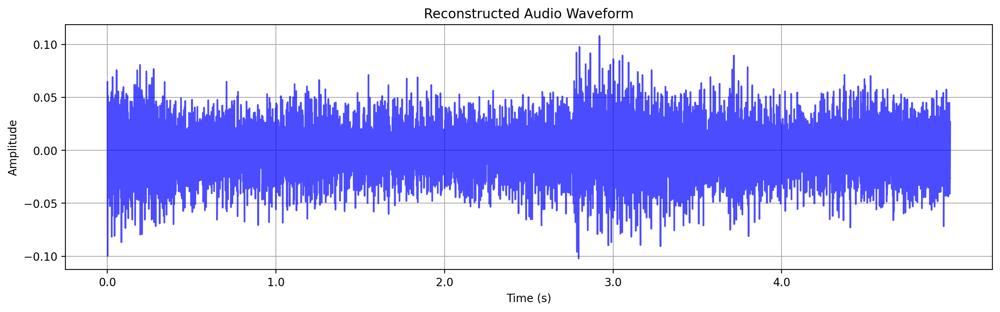

In [114]:
audio_plot(pred_audio, sr, 'blue', 'Reconstructed Audio Waveform')

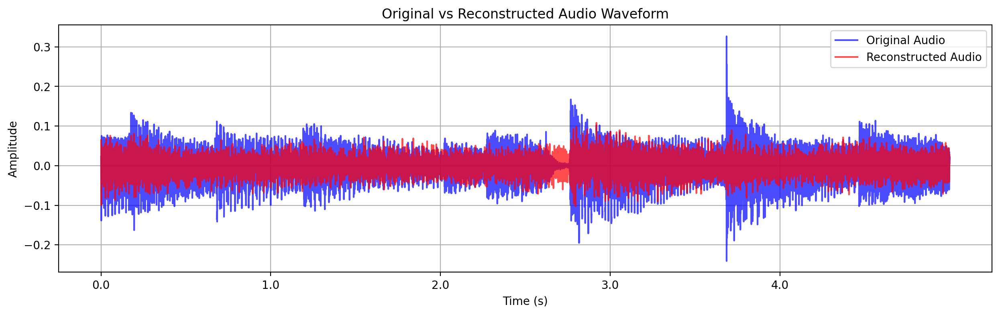

In [115]:
plt.figure(figsize=(15, 4))
plt.plot(audio_5s, color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(pred_audio, color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.xticks(np.arange(0, audio_5s.shape[0], sr), np.arange(0, audio_5s.shape[0] / sr, 1))
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

### Interpolation

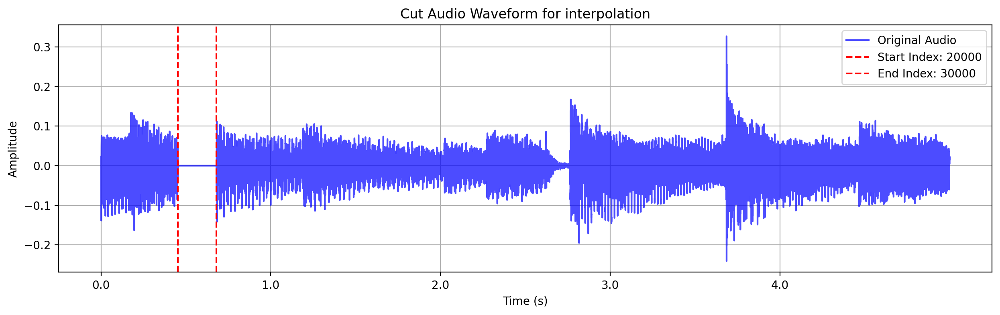

In [116]:
#we have removed 10k samples from the middle
start_idx = 20000
end_idx = 30000

audio_new = audio_5s.clone()
audio_new[start_idx : end_idx] = 0

plt.figure(figsize=(15, 4))
plt.plot(audio_new, color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.axvline(start_idx, color = 'red', linestyle = '--', label = f'Start Index: {start_idx}')
plt.axvline(end_idx, color = 'red', linestyle = '--', label = f'End Index: {end_idx}')
plt.xlabel('Time (s)')
plt.xticks(np.arange(0, audio_5s.shape[0], sr), np.arange(0, audio_5s.shape[0] / sr, 1))
plt.ylabel('Amplitude')
plt.title('Cut Audio Waveform for interpolation')
plt.grid()
plt.legend()
plt.show()

### Extraction

In [117]:
X_rff1 = X_rff[:start_idx]
X_rff2 = X_rff[end_idx:]

audio1 = audio_5s[:start_idx]
audio2 = audio_5s[end_idx:]

#concate X_rff1 and X_rff2
X_rffF = torch.cat((X_rff1, X_rff2), dim = 0)

#concate audio1 and audio2
audioF = torch.cat((audio1, audio2), dim = 0)

In [118]:
print(X_rffF.shape)
print(audioF.shape)

torch.Size([210500, 5000])
torch.Size([210500])


### Linear model on rest of X_rffF

In [119]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_rffF.numpy(), audioF)

LinearRegression()

### Predict on the entire X_rff

In [120]:
pred_audio = model.predict(X_rff.numpy())
print(pred_audio.shape)

(220500,)


In [122]:
print(f"The predicted audio array is : {pred_audio}, \nwith the shape {pred_audio.shape}, duration => {(pred_audio.shape[0])/sr}s")
print(f"\nThe original array is : {audio_5s} \nwith the shape {audio_5s.shape} duration => {(audio_5s.shape[0])/sr}s")

The predicted audio array is : [0.08183022 0.07831354 0.07481869 ... 0.02364786 0.02547999 0.02739437], 
with the shape (220500,), duration => 5.0s

The original array is : tensor([0.0231, 0.0197, 0.0168,  ..., 0.0120, 0.0090, 0.0063]) 
with the shape torch.Size([220500]) duration => 5.0s


In [123]:
s = f"The L2 norm of the reconstructed and original audio : {np.linalg.norm(pred_audio - audio_5s.numpy())}, \nThe L1 norm of the original audio and the reconstructed audio: {np.linalg.norm((pred_audio - audio_5s.numpy()), ord = 1)}"
print(s)

The L2 norm of the reconstructed and original audio : 13.23769760131836, 
The L1 norm of the original audio and the reconstructed audio: 4735.11865234375


### Interpolated audio

In [124]:
Audio(pred_audio, rate = sr)

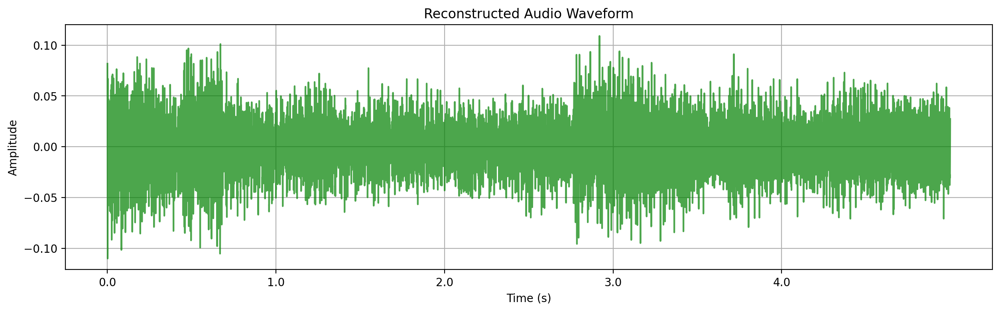

In [75]:
audio_plot(pred_audio, sr, 'green', 'Reconstructed Audio Waveform')

### Comparsion between old and reconstructed 

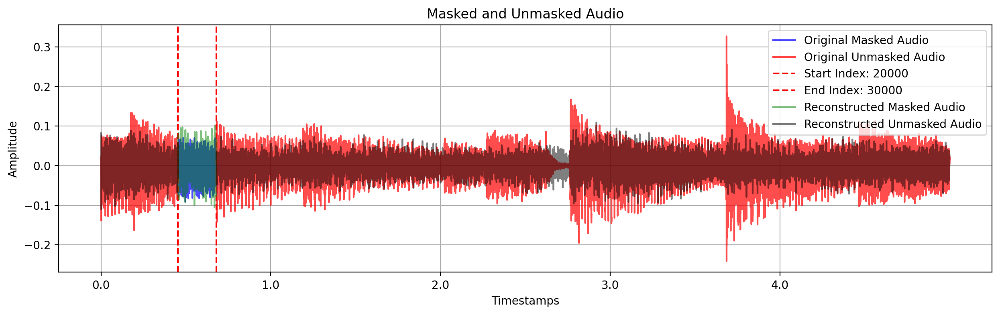

In [77]:
plt.figure(figsize=(15, 4))
plt.plot(np.arange(start_idx,end_idx), audio_5s[start_idx:end_idx].numpy(), color = 'blue', alpha = 0.7, label = 'Original Masked Audio')
plt.plot(np.arange(start_idx),  audio_5s[:start_idx], color = 'red', alpha = 0.7, label = 'Original Unmasked Audio')
plt.plot(np.arange(end_idx, X.shape[0]),  audio_5s[end_idx:], color = 'red', alpha = 0.7)

plt.axvline(start_idx, color = 'red', linestyle = '--', label = f'Start Index: {start_idx}')
plt.axvline(end_idx, color = 'red', linestyle = '--', label = f'End Index: {end_idx}')

plt.plot(np.arange(start_idx,end_idx), pred_audio[start_idx : end_idx], color = 'green', alpha = 0.5, label = 'Reconstructed Masked Audio')
plt.plot(np.arange(start_idx), pred_audio[:start_idx], color = 'black', alpha = 0.5, label = 'Reconstructed Unmasked Audio')
plt.plot(np.arange(end_idx, X.shape[0]), pred_audio[end_idx:], color = 'black', alpha = 0.5)

plt.xlabel('Timestamps')
plt.xticks(np.arange(0,  audio_5s.shape[0], sr), np.arange(0,  audio_5s.shape[0] / sr, 1))
plt.ylabel('Amplitude')
plt.title('Masked and Unmasked Audio')
plt.grid()
plt.legend()
plt.show()

### RMSE and SNR calculation

![SNR Image](https://www.sharetechnote.com/image/RF_SNR_SINAD_SNR_01.png)

In [126]:
def calculate_rmse_snr(audio_5s, pred_audio):
    """
    Calculates the RMSE and SNR between the original audio and predicted audio.
    
    Parameters:
    audio_5s (numpy array or tensor): Original audio signal.
    pred_audio (numpy array or tensor): Predicted audio signal.

    Returns:
    rmse (float): Root Mean Square Error between the original and predicted audio.
    snr (float): Signal-to-Noise Ratio between the original and predicted audio.
    """
    
    #Ensuring that both audio inputs are numpy arrays (if they are PyTorch tensors, convert to numpy)
    if isinstance(audio_5s, torch.Tensor):
         audio_5s =  audio_5s.numpy()
    if isinstance(pred_audio, torch.Tensor):
        pred_audio = pred_audio.numpy()
    
    #Check if both arrays have the same shape
    if audio_5s.shape != pred_audio.shape:
        raise ValueError("The shapes of the original and predicted audio arrays must be the same.")
    
    mse = np.mean((audio_5s - pred_audio) ** 2) 
    rmse = np.sqrt(mse)  
    
    signal_power = np.sum(audio_5s ** 2)  #Power of the original signal
    noise_power = np.sum((audio_5s - pred_audio) ** 2)  #Power of the noise (difference)
    
    if noise_power == 0:
        snr = float('inf')  
    else:
        snr = 10 * np.log10(signal_power / noise_power)  #SNR in dB
    
    return rmse, snr


In [128]:
#Assuming audio_2s and pred_audio are numpy arrays or PyTorch tensors of the same shape
rmse, snr = calculate_rmse_snr(audio_5s, pred_audio)
print(f"RMSE: {rmse}")
print(f"SNR: {snr} dB") #if more features, we couldve got better

RMSE: 0.028190853074193
SNR: 2.1501773595809937 dB


### Vanilla Linear regression -> Training on raw time series 

In [129]:
model = LinearRegression()
model.fit(X, audio_5s)

pred_audio1 = model.predict(X)
print(pred_audio1.shape)

(220500,)


In [135]:
print("Vanilla predicted audio \n")
print(pred_audio1)

print("\nOriginal audio \n")
print(audio_5s)

Vanilla predicted audio 

[-4.0371619e-05 -4.0371375e-05 -4.0371127e-05 ...  1.3982354e-05
  1.3982603e-05  1.3982847e-05]

Original audio 

tensor([0.0231, 0.0197, 0.0168,  ..., 0.0120, 0.0090, 0.0063])


In [136]:
s = f"The L2 norm of the reconstructed and original audio : {np.linalg.norm(pred_audio1 - audio_5s.numpy())}, \nThe L1 norm of the original audio and the reconstructed audio: {np.linalg.norm((pred_audio1 -  audio_5s.numpy()), ord = 1)}"
print(s)

The L2 norm of the reconstructed and original audio : 16.955915451049805, 
The L1 norm of the original audio and the reconstructed audio: 6176.9951171875


In [137]:
Audio(pred_audio1, rate = sr)

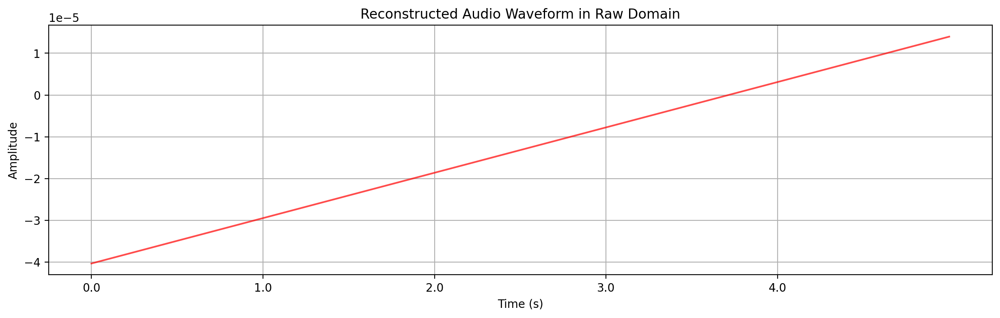

In [139]:
audio_plot(pred_audio1, sr, 'red', 'Reconstructed Audio Waveform in Raw Domain')

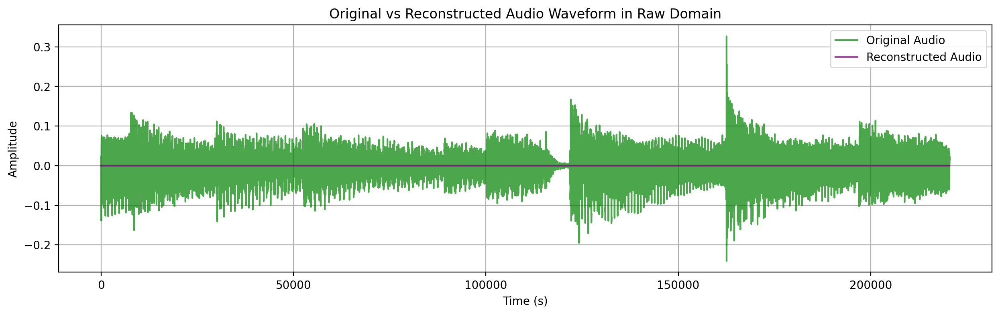

In [140]:
plt.figure(figsize=(15, 4))
plt.plot( audio_5s, color = 'green', alpha = 0.7, label = 'Original Audio')
plt.plot(pred_audio1, color = 'purple', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform in Raw Domain')
plt.grid()
plt.legend()
plt.show()

In [141]:
rmse, snr = calculate_rmse_snr(audio_5s, pred_audio1)
print(f"RMSE: {rmse}")
print(f"SNR: {snr} dB")

RMSE: 0.03610912710428238
SNR: 2.070876945481359e-06 dB
